In [63]:
import cv2
import numpy as np
import random

def embed_watermark(image_path, text, key, alpha):
    # Load the input image
    img = cv2.imread(image_path)

    # Convert the text to binary
    binary_text = ''.join(format(ord(char), '08b') for char in text)
    print("this is the watermark as binary text ",binary_text)
    # Divide the image into non-overlapping blocks of a fixed size
    block_size = 8
    rows, cols, channels = img.shape
    num_blocks_x = cols // block_size
    print("number of blocks in x axis",num_blocks_x)
    num_blocks_y = rows // block_size
    print("number of blocks in y axis ",num_blocks_y)

    # Embed the binary text into the high-frequency coefficients of each block using DCT
    np.random.seed(key)
    for y in range(num_blocks_y):
        for x in range(num_blocks_x):
            block = img[y*block_size:(y+1)*block_size, x*block_size:(x+1)*block_size]
            block = cv2.cvtColor(block, cv2.COLOR_BGR2YCrCb)
            y_channel = block[:, :, 0]
            dct = cv2.dct(np.float32(y_channel))
            high_freq_indices = np.argwhere(np.abs(dct) > alpha)
            print("high frequency indices",high_freq_indices)
            np.random.shuffle(high_freq_indices)
            text_index = 0
            for index in high_freq_indices:
                if text_index == len(binary_text):
                    break
                if dct[index[0], index[1]] > 0:
                    if binary_text[text_index] == '1':
                        dct[index[0], index[1]] -= 1
                    else:
                        dct[index[0], index[1]] += 1
                else:
                    if binary_text[text_index] == '1':
                        dct[index[0], index[1]] += 1
                    else:
                        dct[index[0], index[1]] -= 1
                text_index += 1
            print("dct[index[0], index[1]]",dct[index[0], index[1]])
            y_channel_watermarked = cv2.idct(dct)
            block[:, :, 0] = y_channel_watermarked
            block = cv2.cvtColor(block, cv2.COLOR_YCrCb2BGR)
            img[y*block_size:(y+1)*block_size, x*block_size:(x+1)*block_size] = block

    # Save the watermarked image
    cv2.imwrite('watermarked_image2.png', img)
    cv2.imshow('Watermarked Image', img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    return img
def extract_watermark(image_path, key, alpha,binary_text_len):
    # Load the watermarked image
    img = cv2.imread(image_path)
    block_size = 8
    rows, cols, channels = img.shape
    num_blocks_x = cols // block_size
    print("number of blocks in x axis",num_blocks_x)
    num_blocks_y = rows // block_size
    print("number of blocks in y axis ",num_blocks_y)
    # Extract the binary text from the high-frequency coefficients of each block using DCT
    binary_text = ''
    np.random.seed(key)
    for y in range(num_blocks_y):
        for x in range(num_blocks_x):
            block = img[y*block_size:(y+1)*block_size, x*block_size:(x+1)*block_size]
            block = cv2.cvtColor(block, cv2.COLOR_BGR2YCrCb)
            y_channel = block[:, :, 0]
            dct = cv2.dct(np.float32(y_channel))
            high_freq_indices = np.argwhere(np.abs(dct) > alpha)
            print("high frequency indices",high_freq_indices)
            np.random.shuffle(high_freq_indices)
            text_index = 0
            for index in high_freq_indices:
                print("dct[index[0], index[1]]",dct[index[0], index[1]])
                if binary_text_len == len(binary_text):
                    break
                if dct[index[0], index[1]] % 2 <= 1:
                    binary_text += '0'
                else:
                    binary_text += '1'
                text_index += 1

        print('text_index final',text_index)
        print('binary_text final ',len(binary_text))
    return binary_text

In [64]:
img=embed_watermark('PeppersRGB.bmp','HayaAndMaria',12345,1)

this is the watermark as binary text  010010000110000101111001011000010100000101101110011001000100110101100001011100100110100101100001
number of blocks in x axis 64
number of blocks in y axis  64
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 4]
 [7 5]
 [7 7]]
dct[index[0], index[1]] 9.5
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [3 0]
 [3 1]
 [3 2]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [6 0]
 [6 1]
 [6 2]
 [6 4]
 

high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 4]
 [3 5]
 [3 7]
 [4 0]
 [4 1]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 5.8704348
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 5]
 [1 6]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 6]
 [2 7]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [4 1]
 [4 2]
 [4 3]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 0.72248447
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 7]
 [1 0]
 [1 2]
 [1 3]
 [1 5]
 [1 6]
 [2 0]
 [2 3]
 [2 4]
 [2 6]

high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 2]
 [2 3]
 [2 4]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 4.165766
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 2.875
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0

dct[index[0], index[1]] -20.041908
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [4 0]
 [4 1]
 [4 2]
 [4 4]
 [4 5]
 [4 6]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 3]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -4.75
high frequency indices [[0 0]
 [0 1]
 [0 3]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 1]
 [4 3]
 [4 5]
 [4 6]
 [4 7]
 [5 1]
 [5 2]
 [5 3]
 [5 5]
 [5 7]
 [6 1]
 [6 2]
 [6 4]
 [6 6]
 [6 7]
 [7 0]
 [7 2]
 [7 3]
 [7 4]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -3.1147165
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1

dct[index[0], index[1]] 6.2658505
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 4]
 [7 5]
 [7 6]]
dct[index[0], index[1]] -4.647134
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 1]
 [4 3]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 4]
 [5 6]
 [5 7]
 [6 2]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 3]
 [7 4]
 [7 5]
 [7 6]]
dct[index[0], index[1]] 720.125
high frequency indices [[0 0]
 [0 2]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 5]
 [2 0]
 [2

high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [1 0]
 [1 1]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [6 0]
 [6 1]
 [6 2]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 2]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -3.534009
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 3]
 [2 4]
 [2 6]
 [2 7]
 [3 0]
 [3 2]
 [3 3]
 [3 4]
 [3 6]
 [3 7]
 [4 1]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 3]
 [5 4]
 [5 5]
 [5 7]
 [6 0]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 2]
 [7 3]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 6.293402
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 4]
 [1 5]
 [1 6]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 2]
 [3 3]
 [3 4]
 [4 1]
 

high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 4]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 2]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 4]
 [6 7]
 [7 0]
 [7 2]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 12.205357
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 5]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 7]
 [5 0]
 [5 1]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 2.833621
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 

high frequency indices [[0 0]
 [0 1]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 7]
 [3 0]
 [3 2]
 [3 3]
 [3 5]
 [3 7]
 [4 0]
 [4 2]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 1]
 [6 2]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 3]
 [7 4]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -6.982477
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 6]
 [3 0]
 [3 1]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 3.5
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 5]
 [1 6]
 [2 1]
 [2 3]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 4]
 [3 6]

high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [4 0]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 3]
 [6 5]
 [6 7]
 [7 1]
 [7 2]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -4.974845
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 7]
 [3 0]
 [3 2]
 [3 3]
 [3 5]
 [3 6]
 [3 7]
 [4 1]
 [4 3]
 [4 5]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 1]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 3]
 [7 4]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -10.949569
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [2 0]
 [2 1]

dct[index[0], index[1]] 0.756513
high frequency indices [[0 0]
 [0 1]
 [0 3]
 [0 4]
 [0 6]
 [1 0]
 [1 1]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 7]
 [3 0]
 [3 1]
 [3 3]
 [3 4]
 [3 6]
 [3 7]
 [4 0]
 [4 2]
 [4 4]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 3]
 [6 4]
 [7 0]
 [7 2]
 [7 3]
 [7 4]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 0.48361242
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 3]
 [1 7]
 [2 0]
 [2 1]
 [2 3]
 [2 5]
 [2 7]
 [3 0]
 [3 2]
 [3 4]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 6]
 [4 7]
 [5 0]
 [5 4]
 [5 5]
 [6 3]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -7.766041
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 1]
 [2 4]
 [2 6]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [5 2]
 [5 4]
 [5 5]
 [6 0]
 [6 1]
 [6 4]
 [6 5]
 [6 6]
 [7 0]
 

dct[index[0], index[1]] 2.1876786
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 3]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -5.3585405
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 7.0462694
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]


high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 2]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -5.2945423
high frequency indices [[0 0]
 [0 1]
 [0 3]
 [0 4]
 [0 5]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 5]
 [5 6]
 [6 0]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -4.205632
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 5]
 [2 6]

high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 4]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 2.511503
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 7]
 [6 0]
 [6 2]
 [6 4]
 [6 7]
 [7 1]
 [7 2]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 14.681899
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 5]
 [0 6]
 [1 0]
 [1 2]
 [1 3]
 [1 5]
 [2 0]
 [2 1]
 

high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 5]
 [4 6]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 4.3708344
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 6]
 [4 0]
 [4 1]
 [4 2]
 [4 4]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 1]
 [7 2]
 [7 3]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -0.08959901
high frequency indices [[0 0]
 [0 1]
 [0 3]
 [0 4]
 [0 5]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4

dct[index[0], index[1]] 0.61474204
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 7]
 [7 0]
 [7 1]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -6.539175
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 4]
 [2 6]
 [2 7]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 5]
 [4 6]
 [5 0]
 [5 1]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 5]
 [6 7]
 [7 0]
 [7 3]
 [7 5]
 [7 6]]
dct[index[0], index[1]] -4.602014
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]


dct[index[0], index[1]] 1.2248738
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 5]
 [2 6]
 [3 2]
 [3 5]
 [3 6]
 [4 0]
 [4 1]
 [4 2]
 [4 4]
 [4 5]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 3]
 [6 5]
 [6 6]
 [6 7]
 [7 1]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 1.562582
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 6]
 [2 0]
 [2 1]
 [2 3]
 [2 4]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [4 0]
 [4 1]
 [4 3]
 [4 4]
 [4 5]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 3]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -2.9482377
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 5]
 [2 0]
 [2 2]
 [2 4]
 [2 5]
 [2 6]
 [3 0]
 [3 1]
 

In [65]:
watermark_text='HayaAndMaria'
binary_text = ''.join(format(ord(char), '08b') for char in watermark_text)
print("Watermark: ",binary_text)
print(len(binary_text))

Watermark:  010010000110000101111001011000010100000101101110011001000100110101100001011100100110100101100001
96


In [66]:
extracted_text=extract_watermark('watermarked_image2.png',12345,1,96)

number of blocks in x axis 64
number of blocks in y axis  64
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [4 0]
 [4 1]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 4]
 [7 5]
 [7 7]]
dct[index[0], index[1]] 7.112937
dct[index[0], index[1]] -25.776457
dct[index[0], index[1]] 11.511914
dct[index[0], index[1]] 5.237797
dct[index[0], index[1]] -32.68069
dct[index[0], index[1]] 1.4064467
dct[index[0], index[1]] -2.1139605
dct[index[0], index[1]] 13.39286
dct[index[0], index[1]] 10.142154
dct[index[0], index[1]] 6.629149
dct[index[0], index[1]] 6.996606
dct[index[0], index[1]] -58.30663
dct[index[0], index[1]] -51.98769
dct[index[0], index[1]] 8.423247
dct[index[0], index[1]] -95.528
dct[index[0], index[1]] -3

high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 5]
 [2 6]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 5]
 [4 0]
 [4 2]
 [4 5]
 [4 7]
 [5 1]
 [5 2]
 [5 3]
 [5 5]
 [5 6]
 [6 0]
 [6 1]
 [6 2]
 [6 6]
 [6 7]
 [7 0]
 [7 2]
 [7 3]
 [7 5]
 [7 6]]
dct[index[0], index[1]] -4.947146
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 6]
 [2 7]
 [3 0]
 [3 2]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 1]
 [4 4]
 [5 0]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 1]
 [6 3]
 [6 7]
 [7 3]
 [7 7]]
dct[index[0], index[1]] -7.5
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7

dct[index[0], index[1]] 2.139414
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 5]
 [1 6]
 [1 7]
 [2 1]
 [2 3]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 6]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 6]
 [5 7]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 4]
 [7 5]
 [7 7]]
dct[index[0], index[1]] -4.221123
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [2 0]
 [2 2]
 [2 3]
 [2 4]
 [2 6]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 5]
 [3 6]
 [4 0]
 [4 2]
 [4 3]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 6]
 [6 7]
 [7 1]
 [7 2]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -7.554365
text_index final 0
binary_text final  96
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 3]
 [1

dct[index[0], index[1]] 1476.875
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [2 0]
 [2 1]
 [2 2]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 4]
 [3 7]
 [4 0]
 [4 1]
 [5 0]
 [5 1]
 [5 2]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 2]
 [6 4]
 [6 6]
 [6 7]
 [7 2]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -4.637861
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 4]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [3 0]
 [3 1]
 [3 2]
 [3 5]
 [3 6]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 4]
 [5 5]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 2]
 [7 3]
 [7 4]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -1.9324594
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 

high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [2 1]
 [2 2]
 [2 3]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 5]
 [4 6]
 [5 0]
 [5 2]
 [5 4]
 [5 6]
 [5 7]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [7 0]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -3.449652
high frequency indices [[0 0]
 [0 1]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 3]
 [2 4]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 3]
 [3 5]
 [3 6]
 [4 0]
 [4 2]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 7]
 [6 1]
 [6 2]
 [6 4]
 [6 6]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 1.6402634
high frequency indices [[0 0]
 [0 1]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [1 0]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 7]
 [3 0]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 2]
 [4 6]
 [4 7]
 [5 0]
 [5 2]


In [67]:
print("Extracted:",extracted_text)

Extracted: 101111110001000010110110101011000101010000011111011101110000110111010110111111110100101101000000


PSNR

In [68]:
import numpy as np
from PIL import Image

def calculate_psnr(img1_path, img2_path):
    # Open images and convert to numpy arrays
    img1 = np.array(Image.open(img1_path))
    img2 = np.array(Image.open(img2_path))
    
    # Ensure the images are the same size
    if img1.shape != img2.shape:
        raise ValueError('Images must be the same size')
    
    # Calculate the mean squared error
    mse = np.mean((img1 - img2)**2)
    
    # Calculate the maximum possible pixel value
    max_pixel = 255.0
    
    # Calculate the PSNR
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    
    return psnr


PSNR before Noise

In [77]:
psnr = calculate_psnr('watermarked_image2.png', 'PeppersRGB.bmp')
print('PSNR:', psnr)


PSNR: 46.523455659193296


PSNR after Noise

In [78]:
psnr = calculate_psnr('noisy_image2.bmp', 'PeppersRGB.bmp')
print('PSNR:', psnr)

PSNR: 39.03931137696258


MSE

In [46]:
import numpy as np

def calculate_mse(str1, str2):
    # convert binary strings to numpy arrays
    arr1 = np.fromiter(str1, dtype=np.int8) - ord('0')
    arr2 = np.fromiter(str2, dtype=np.int8) - ord('0')

    # calculate squared difference between arrays
    diff = arr1 - arr2
    squared_diff = diff ** 2

    # calculate mean squared error
    mse = np.mean(squared_diff)

    return mse


MSE before Noise

In [71]:
str1 = binary_text
str2 = extracted_text

mse = calculate_mse(str1, str2)

print("MSE:", mse)


MSE: 0.4895833333333333


MSE after Noise

In [75]:
str1 = binary_text
str2 = extracted_text_after_noise

mse = calculate_mse(str1, str2)

print("MSE:", mse)

MSE: 0.5208333333333334


NOISE

In [48]:
import cv2
import numpy as np

def add_speckle_noise(image_path, stddev, output_path):
    # Load the image
    img = cv2.imread(image_path)

    # Add speckle noise
    noise = np.random.normal(0, stddev, img.shape)
    noisy_img = img + img * noise

    # Save the noisy image
    cv2.imwrite(output_path, noisy_img)

    return noisy_img

In [72]:
noisy_img = add_speckle_noise('watermarked_image2.png', 0.02, 'noisy_image2.bmp')
cv2.imshow('Noisy Image', noisy_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

Extract From noisy image

In [73]:
extracted_text_after_noise=extract_watermark('noisy_image2.bmp',12345,1,96)

number of blocks in x axis 64
number of blocks in y axis  64
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 4]
 [7 5]
 [7 7]]
dct[index[0], index[1]] -2.1540027
dct[index[0], index[1]] 8.660534
dct[index[0], index[1]] 7.068145
dct[index[0], index[1]] -25.848913
dct[index[0], index[1]] 4.0751076
dct[index[0], index[1]] 6.7974463
dct[index[0], index[1]] 10.460343
dct[index[0], index[1]] 3.9637878
dct[index[0], index[1]] -32.57822
dct[index[0], index[1]] 13.630042
dct[index[0], index[1]] 5.838514
dct[index[0], index[1]] -54.4116
dct[index[0], index[1]] 14.102115
dct[index[0], index[1]] 14.377454
dct[index[0], index[1]] -1.5894655


high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 3]
 [7 4]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -4.4926405
high frequency indices [[0 0]
 [0 1]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 6]
 [3 0]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [4 1]
 [4 3]
 [4 5]
 [4 6]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 1]
 [7 2]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 2.2330625
high frequency indices [[0 0]
 [0 2]
 [0 3]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 4]
 [1 6]
 [2 0]
 [2 2]
 [2 4]
 [2 5]
 [2 7]
 [3 0]
 [3 1]
 [3 4]
 [4 1]
 [4 2]

high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 3]
 [2 4]
 [2 6]
 [2 7]
 [3 1]
 [3 2]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 6]
 [5 7]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 6]
 [6 7]
 [7 1]
 [7 2]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -1.9633886
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [6 1]
 [6 2]
 [6 3]
 [6 5]
 [6 6]
 [6 7]
 [7 2]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -8.069028
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 5]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]

high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 6]
 [4 0]
 [4 1]
 [4 3]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 4]
 [7 5]
 [7 7]]
dct[index[0], index[1]] 9.7594385
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 6]
 [1 1]
 [1 2]
 [1 4]
 [1 5]
 [1 6]
 [2 0]
 [2 1]
 [2 2]
 [2 4]
 [2 5]
 [2 7]
 [3 0]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 4]
 [5 5]
 [5 6]
 [6 0]
 [6 1]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [7 0]
 [7 1]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -5.437015
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 6]
 [2 7]
 [3 0]
 [3 1]
 [3 2]


high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 4]
 [2 5]
 [2 6]
 [3 1]
 [3 2]
 [3 3]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 6]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 4]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 3]
 [7 4]
 [7 5]
 [7 7]]
dct[index[0], index[1]] -8.06281
high frequency indices [[0 0]
 [0 2]
 [0 3]
 [0 4]
 [0 6]
 [1 1]
 [1 3]
 [1 4]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [3 0]
 [3 1]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 5]
 [4 7]
 [5 0]
 [5 1]
 [5 2]
 [5 3]
 [5 4]
 [5 5]
 [5 6]
 [5 7]
 [6 0]
 [6 1]
 [6 2]
 [6 3]
 [6 4]
 [6 5]
 [6 6]
 [6 7]
 [7 0]
 [7 1]
 [7 2]
 [7 3]
 [7 6]
 [7 7]]
dct[index[0], index[1]] 6.040214
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [

high frequency indices [[0 0]
 [0 1]
 [0 3]
 [0 5]
 [0 6]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [3 1]
 [3 2]
 [3 4]
 [3 5]
 [3 6]
 [4 1]
 [4 2]
 [4 4]
 [4 6]
 [5 0]
 [5 1]
 [5 3]
 [5 4]
 [5 5]
 [5 7]
 [6 0]
 [6 1]
 [6 3]
 [6 4]
 [6 5]
 [6 7]
 [7 0]
 [7 4]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -6.0491443
high frequency indices [[0 0]
 [0 1]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 3]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 1]
 [2 2]
 [2 3]
 [2 4]
 [2 5]
 [2 6]
 [3 0]
 [3 1]
 [3 2]
 [3 4]
 [3 7]
 [4 1]
 [4 2]
 [4 3]
 [4 4]
 [4 6]
 [4 7]
 [5 0]
 [5 2]
 [5 3]
 [5 4]
 [5 6]
 [5 7]
 [6 0]
 [6 2]
 [6 3]
 [6 7]
 [7 2]
 [7 3]
 [7 4]
 [7 5]
 [7 6]
 [7 7]]
dct[index[0], index[1]] -1.2657558
high frequency indices [[0 0]
 [0 1]
 [0 2]
 [0 3]
 [0 4]
 [0 5]
 [0 6]
 [0 7]
 [1 0]
 [1 1]
 [1 2]
 [1 4]
 [1 5]
 [1 6]
 [1 7]
 [2 0]
 [2 2]
 [2 4]
 [2 5]
 [2 6]
 [3 0]
 [3 1]
 [3 4]
 [3 5]
 [3 6]
 [3 7]
 [4 0]
 [4 2]
 [4 3]
 [4 5]
 [4 6]
 [4 7

In [74]:
print(extracted_text_after_noise)

101000011111000011100000000000011111011011101110101111011100001110010010001010001100100011011110


NC

In [31]:
def normalized_correlation(s1, s2):
    if len(s1) != len(s2):
        raise ValueError("The two strings must be of equal length")
    n = len(s1)
    mean_s1 = sum(int(ch) for ch in s1) / n
    mean_s2 = sum(int(ch) for ch in s2) / n
    var_s1 = sum((int(ch) - mean_s1) ** 2 for ch in s1) / n
    var_s2 = sum((int(ch) - mean_s2) ** 2 for ch in s2) / n
    cov = sum((int(ch1) - mean_s1) * (int(ch2) - mean_s2) for ch1, ch2 in zip(s1, s2)) / n
    return cov / (var_s1 ** 0.5 * var_s2 ** 0.5)

In [79]:
str1 = '010010000110000101111001011000010100000101101110011001000100110101100001011100100110100101100001'
str2 = '101000011111000011100000000000011111011011101110101111011100001110010010001010001100100011011110'

nc = normalized_correlation(str1, str2)
print("The normalized correlation is:", nc)


The normalized correlation is: -0.04519776737830869


SSIM

In [80]:
from skimage import img_as_float
from skimage.metrics import structural_similarity as ssim

def calculate_ssim(image1, image2):
    # Convert images to floating point representation
    image1 = img_as_float(image1)
    image2 = img_as_float(image2)

    # Calculate SSIM between the two images
    ssim_val, _ = ssim(image1, image2, multichannel=True, full=True)

    return ssim_val


In [82]:
from skimage import io

# Load two color images
image1 = io.imread("noisy_image2.bmp")
image2 = io.imread("PeppersRGB.bmp")

# Calculate SSIM between the two images
ssim_val = calculate_ssim(image1, image2)

print("The SSIM between the two images is:", ssim_val)


The SSIM between the two images is: 0.9793896376435772


C:\Users\ASUS\AppData\Local\Temp\ipykernel_15208\1882122607.py:10: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_val, _ = ssim(image1, image2, multichannel=True, full=True)


Histogram For noisy image

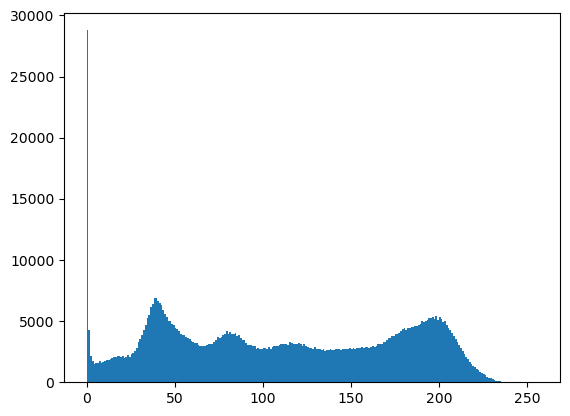

In [83]:
import matplotlib.pyplot as plt

hist, bins = np.histogram(noisy_img.ravel(), 256, [0,256])
plt.hist(noisy_img.ravel(), 256, [0,256])
plt.show()

Histogram For watermarked image

In [84]:
img2 = cv2.imread('watermarked_image2.png')

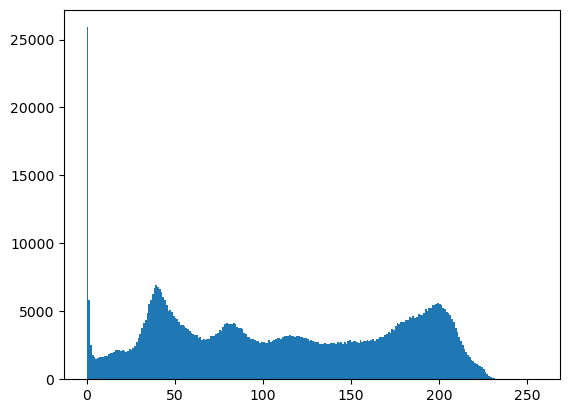

In [85]:
hist, bins = np.histogram(img2.ravel(), 256, [0,256])
plt.hist(img2.ravel(), 256, [0,256])
plt.show()